In [37]:
import json
import pandas as pd
import numpy as np
from typing import Any
from pathlib import Path

from scipy.interpolate import griddata
import matplotlib.pyplot as plt
from matplotlib import cm

## Load the data:

In [38]:
# Set the file path:
path = "results/"
file_name = "result_GridSearch_ST_max.jsonl"

In [39]:
def parse_results(path: str) -> pd.DataFrame:
    records = []
    with open(path, 'r') as f:
        buffer = []
        depth = 0

        for raw in f:
            line = raw.strip()
            if not line:
                continue  # skip blank lines

            # Track nesting of braces
            depth += line.count('{')
            depth -= line.count('}')

            buffer.append(raw)
            # If we’ve closed all opened braces, process one full JSON object
            if depth == 0 and buffer:
                chunk = ''.join(buffer)
                obj = json.loads(chunk)
                # same flattening logic as before
                for uid, details in obj.items():
                    params = details.pop('params')
                    flat = {'id': uid, **details}
                    for p, v in params.items():
                        if isinstance(v, list) and len(v) == 2:
                            flat[f'{p}_x'] = v[0]
                            flat[f'{p}_y'] = v[1]
                        else:
                            flat[p] = v
                    records.append(flat)
                buffer = []
    return pd.DataFrame(records)

In [40]:
df = parse_results(path + file_name)

In [41]:
df.head()

,id,score,total_ghosts,overall_ghost_rate,event_avg_ghost_rate,clone_percentage,total_tracks,time,scatter,min_strong_track_length,allowed_missed_modules
0,f90e06d4-5607-4517-8c59-8111839f9ab9,999999.595169,0,0.0,0.0,0.0,0,1.487921,NaN,NaN,NaN
1,6f989245-9e92-4ae7-9f89-45625b8d68e5,999999.294861,0,0.0,0.0,0.0,0,0.737152,0.0,1.0,1.0
2,fceb8a4c-e115-4141-bb8a-fcd619b6bc76,999999.295922,0,0.0,0.0,0.0,0,0.739806,0.0,1.0,2.0
3,a6db1f90-a202-4dba-9005-e7955f8af5b0,999999.262910,0,0.0,0.0,0.0,0,0.657274,0.0,1.0,3.0
4,16eeb726-5817-49e9-92ec-bc884b113601,999999.249081,0,0.0,0.0,0.0,0,0.622702,0.0,1.0,4.0


### Get the configuration file from these results

In [42]:
def get_config(file_path: str):
    stem = Path(file_path).stem            
    config_name = stem.removeprefix("result_")      
    
    config_path = Path("configurations") / f"{config_name}.json"
    
    # 3) Open & load the JSON
    with config_path.open("r", encoding="utf-8") as f:
        config = json.load(f)
    return config



In [43]:
configuration = get_config(file_name)
print(configuration)

{'solverName': 'GridSearch', 'num_events': 100, 'intra_node': True, 'max_runs': 1000000, 'optimizer': {'objective': 'min', 'nested': True, 'weights': [0.4, 0.2, 0.3, -5.0], 'resolution': 42}, 'reconstruction_algo': 'ST'}


# Example scripts for plots & Graphs

## SETUP CUSTOM STYLING FOR THE PLOTS

**plot the score / itterations**

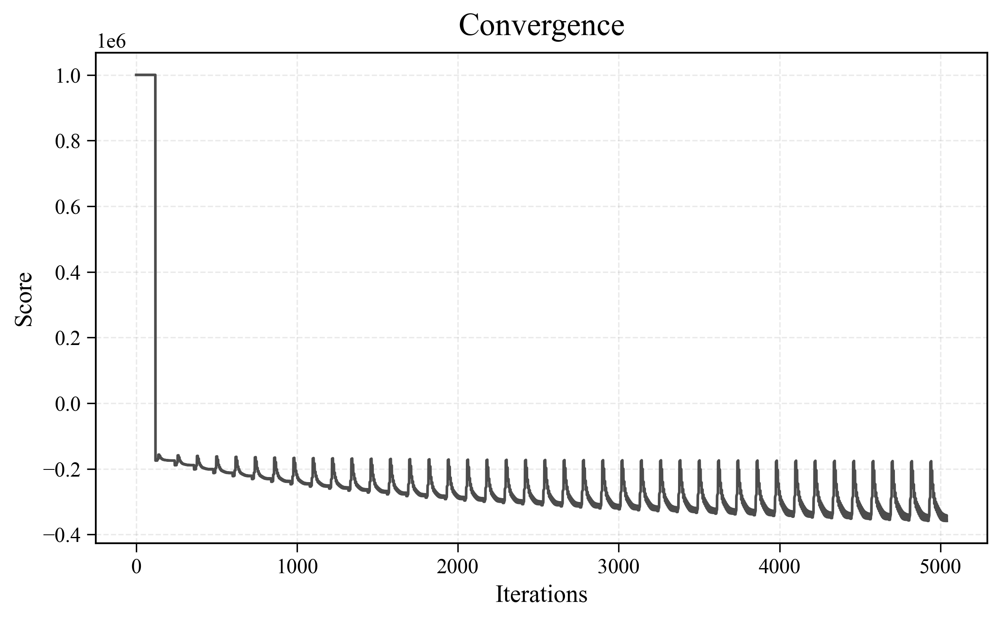

In [44]:
def plot_convergence(
    df,
    figsize=(8, 5),
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    color="#4C4C4C",
    linestyle="-",
    linewidth=1.5
):
    # 1) Configure rcParams
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "figure.dpi":        dpi,
        "axes.linewidth":    1.0,
        "xtick.major.size":  5,
        "ytick.major.size":  5,
        "xtick.major.width": 0.8,
        "ytick.major.width": 0.8,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    # 2) Plot
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(
        df.index,
        df['score'],
        color=color,
        linestyle=linestyle,
        linewidth=linewidth
    )
    ax.set_title("Convergence", pad=10)
    ax.set_xlabel("Iterations", fontsize=label_fontsize)
    ax.set_ylabel("Score", fontsize=label_fontsize)
    ax.grid(True)  # already styled via rcParams

    plt.tight_layout()
    plt.show()

plot_convergence(df)


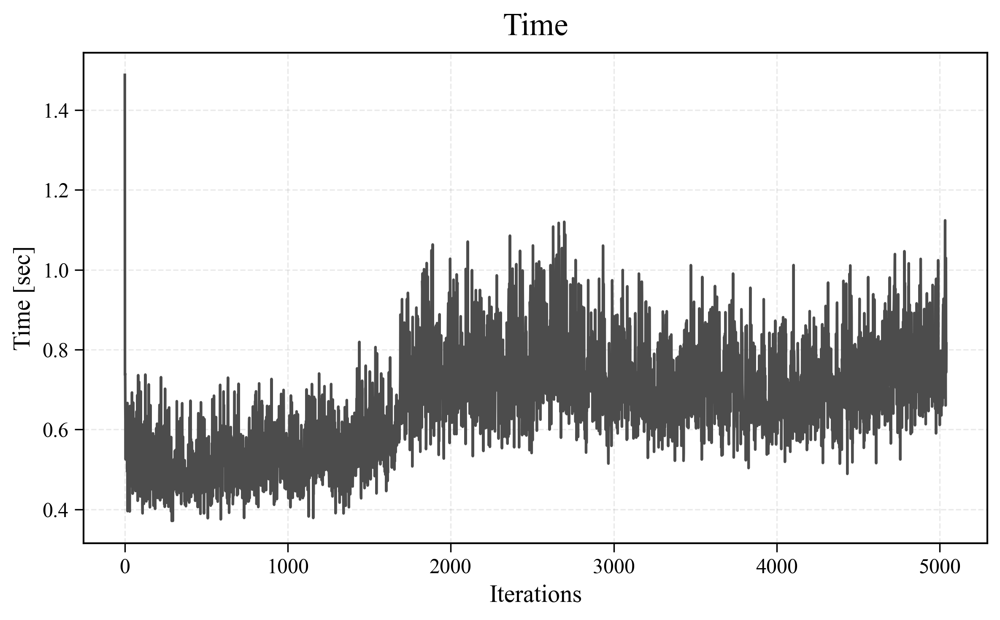

In [45]:
def plot_convergence_time(
    df,
    figsize=(8, 5),
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    color="#4C4C4C",
    linestyle="-",
    linewidth=1.5
):
    # 1) Configure rcParams
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "figure.dpi":        dpi,
        "axes.linewidth":    1.0,
        "xtick.major.size":  5,
        "ytick.major.size":  5,
        "xtick.major.width": 0.8,
        "ytick.major.width": 0.8,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    # 2) Plot
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(
        df.index,
        df['time'],
        color=color,
        linestyle=linestyle,
        linewidth=linewidth
    )
    ax.set_title("Time", pad=10)
    ax.set_xlabel("Iterations", fontsize=label_fontsize)
    ax.set_ylabel("Time [sec]", fontsize=label_fontsize)
    ax.grid(True)  # already styled via rcParams

    plt.tight_layout()
    plt.show()
plot_convergence_time(df)

In [46]:
print(df.columns)

Index(['id', 'score', 'total_ghosts', 'overall_ghost_rate',
       'event_avg_ghost_rate', 'clone_percentage', 'total_tracks', 'time',
       'scatter', 'min_strong_track_length', 'allowed_missed_modules'],
      dtype='object')


In [47]:
print(max(df.score))
print(min(df.score))

999999.5951685905
-358631.6668241529


In [48]:
def plot_expected_score_by_param(
    df,
    params=None,
    figsize=(8, 5),
    colors=None,
    linestyles=None,
    linewidths=None,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    legend_fontsize=12,
    dpi=300,
    Title="INSERT",
    XAxis="INSERT"
):
    """
    Plot expected score (mean score) versus each hyperparameter in `params` with publication-quality styling.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'score' and hyperparameter columns.
    params : list[str], optional
        List of hyperparameter column names to plot. 
        If None, will use all columns except 'id' and 'score'.
    figsize : tuple, default=(8, 5)
        Figure size in inches.
    colors : list[str], optional
        Line colors for each parameter. Defaults to Tableau 10.
    linestyles : list[str], optional
        Line styles for each parameter. Defaults to solid lines.
    linewidths : list[float], optional
        Line widths for each parameter. Defaults to 1.5.
    title_fontsize, label_fontsize, tick_fontsize, legend_fontsize, dpi : int
        Matplotlib styling parameters.
    """
    if params is None:
        params = [c for c in df.columns if c not in ['id', 'score']]
    n = len(params)
    # Default style arrays
    if colors is None:
        gray_cmap = cm.get_cmap('Greys')
        gray_levels = np.linspace(0.3, 0.7, n)            # adjust range for contrast
        colors = [gray_cmap(g) for g in gray_levels]
        print(colors)
    if linestyles is None:
        linestyles = ['-'] * n
    if linewidths is None:
        linewidths = [1.5] * n

    # 1) Configure rcParams for publication‐quality styling
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "legend.fontsize":   legend_fontsize,
        "figure.dpi":        dpi,
        "axes.linewidth":    1.0,
        "xtick.major.size":  5,
        "ytick.major.size":  5,
        "xtick.major.width": 0.8,
        "ytick.major.width": 0.8,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    means = df.groupby(params)['score'].mean()
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(
        means.index, 
        means.values,
        label=f'Expected Score',
        color=colors[0],
        linestyle=linestyles[0],
        linewidth=linewidths[0]
    )
    ax.set_title(Title, pad=10)
    ax.set_xlabel(XAxis, fontsize=label_fontsize)
    ax.set_ylabel('Expected Score', fontsize=label_fontsize)
    # If many unique values, rotate xticks
    if len(means.index) > 10:
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


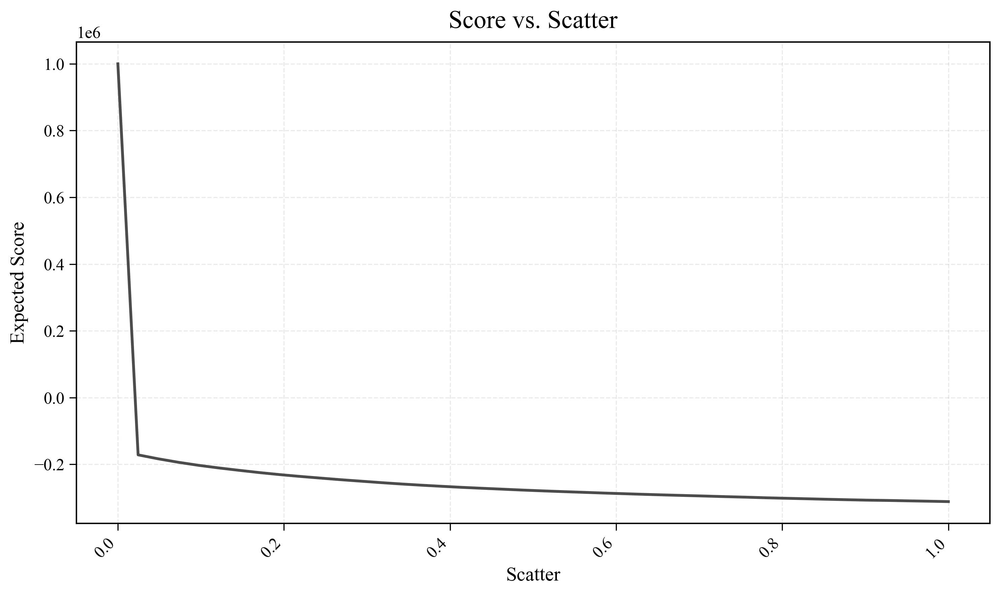

In [49]:
plot_expected_score_by_param(
    df,
    params='scatter',
    figsize=(10,6),
    colors=['#4C4C4C'],
    linestyles=['-','--'],
    linewidths=[2,2],
    Title="Score vs. Scatter",
    XAxis="Scatter"
)

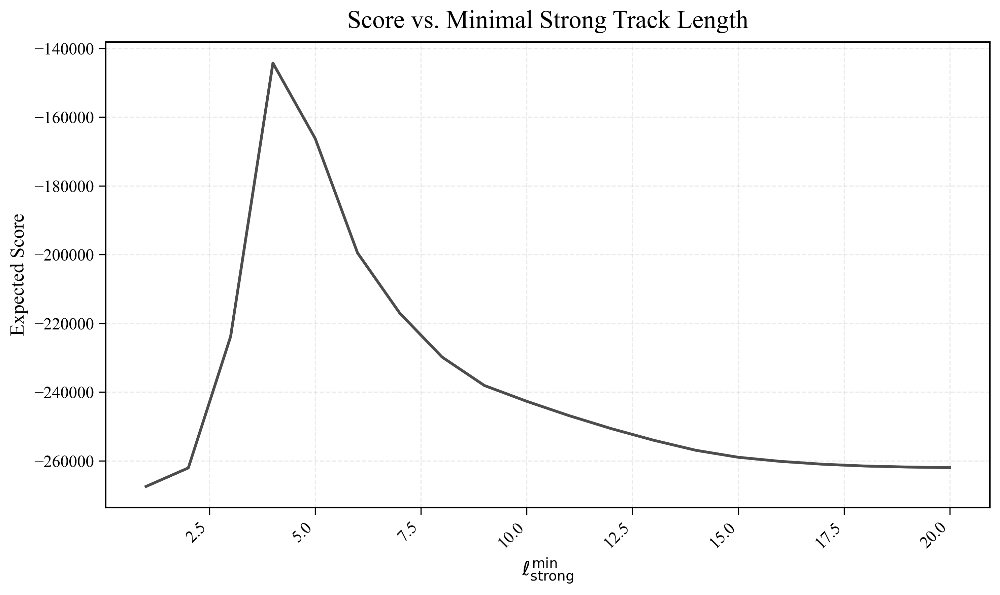

In [50]:
plot_expected_score_by_param(
    df,
    params='min_strong_track_length',
    figsize=(10,6),
    colors=['#4C4C4C'],
    linestyles=['-','--'],
    linewidths=[2,2],
    Title="Score vs. Minimal Strong Track Length",
    XAxis=r"$\ell_{\mathrm{strong}}^{\min}$"
)

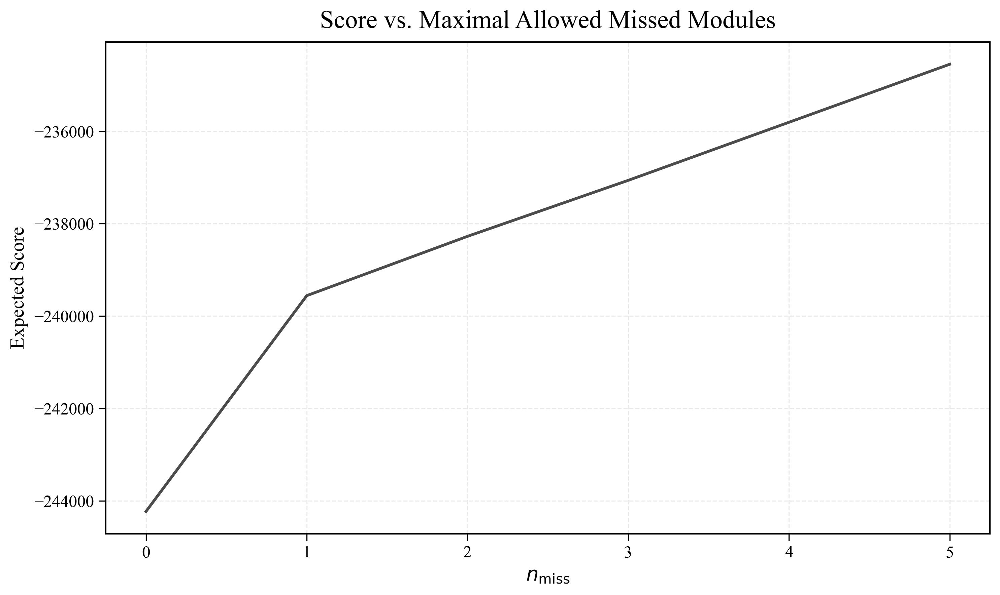

In [51]:
plot_expected_score_by_param(
    df,
    params='allowed_missed_modules',
    figsize=(10,6),
    colors=['#4C4C4C'],
    linestyles=['-','--'],
    linewidths=[2,2],
    Title="Score vs. Maximal Allowed Missed Modules",
    XAxis=r"$n_{\mathrm{miss}}$"
)

## Print the best set of params

In [52]:
df[df['score'] == df['score'].min()]

,id,score,total_ghosts,overall_ghost_rate,event_avg_ghost_rate,clone_percentage,total_tracks,time,scatter,min_strong_track_length,allowed_missed_modules
5040,505a6e6f-e1a6-4851-aad7-d0483cb5a12f,-358631.666824,41724,58.16813,52.240786,2.819223,71730,0.815418,1.0,1.0,0.0


# Plot hit map

In [53]:
def plot_score_scatter_by_params(
    df,
    x_param,
    y_param,
    figsize=(8, 5),
    cmap='viridis',
    marker='o',
    alpha=0.8,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    cbar_label='Score',
    dpi=300,
    title="INSERT A TITLE",
    XTitle="INSERT",
    YTitle="INSERT"
):
    """
    Scatter plot of score as color vs two hyperparameters.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'score' and hyperparameter columns.
    x_param : str
        Column name for x-axis.
    y_param : str
        Column name for y-axis.
    figsize : tuple, default=(8, 5)
        Figure size in inches.
    cmap : str or Colormap, default='viridis'
        Colormap for score values.
    marker : str, default='o'
        Marker style.
    alpha : float, default=0.8
        Alpha blending for markers.
    title_fontsize, label_fontsize, tick_fontsize, dpi : int
        Matplotlib styling parameters.
    cbar_label : str, default='Score'
        Label for the colorbar.
    """
    # Configure rcParams for publication-quality styling
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "figure.dpi":        dpi,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    fig, ax = plt.subplots(figsize=figsize)
    sc = ax.scatter(
        df[x_param],
        df[y_param],
        c=df['score'],
        cmap=cmap,
        marker=marker,
        alpha=alpha
    )
    ax.set_title(title, pad=10)
    ax.set_xlabel(XTitle)
    ax.set_ylabel(YTitle)

    # Add colorbar
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(cbar_label)

    # Rotate tick labels if needed
    if df[x_param].nunique() > 10:
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    if df[y_param].nunique() > 10:
        plt.setp(ax.get_yticklabels(), rotation=45, va='top')

    plt.tight_layout()
    plt.show()



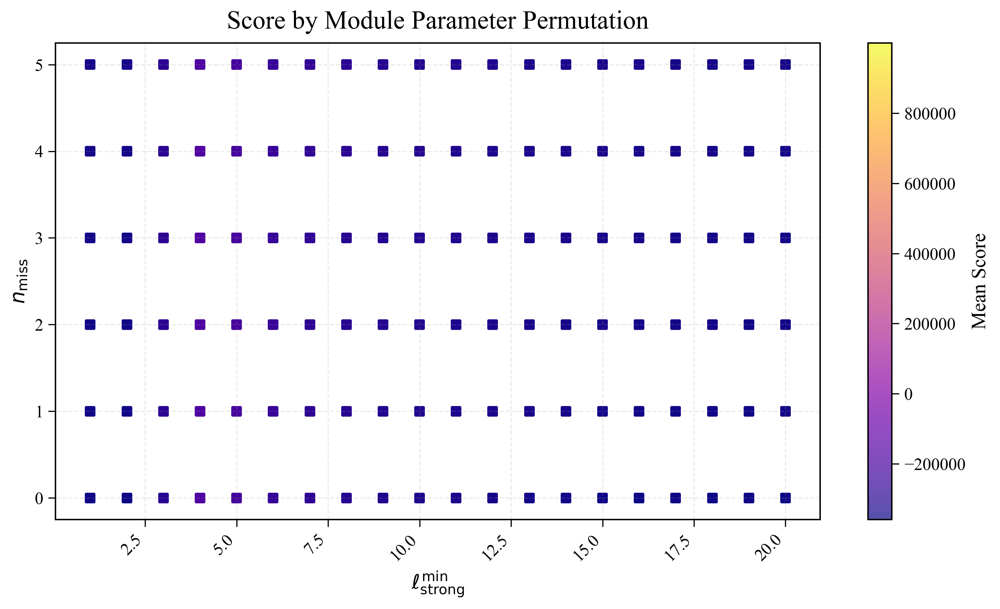

In [54]:
plot_score_scatter_by_params(
    df,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    figsize=(10, 6),
    cmap='plasma',
    marker='s',
    alpha=0.7,
    cbar_label='Mean Score',
    title="Score by Module Parameter Permutation",
    XTitle=r"$\ell_{\mathrm{strong}}^{\min}$",
    YTitle=r"$n_{\mathrm{miss}}$"
)

In [55]:
def plot_score_landscape(
    df,
    x_param,
    y_param,
    figsize=(8, 5),
    cmap='viridis',
    alpha=0.8,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    cbar_label='Score',
    dpi=300,
    title="INSERT A TITLE",
    XTitle="INSERT",
    YTitle="INSERT",
    resolution=100,
    show_scatter=True
):
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.interpolate import griddata

    # Drop rows with NaNs in relevant columns
    df_clean = df[[x_param, y_param, 'score']].dropna()

    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean['score'].values

    # Grid for interpolation
    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)

    # Interpolate: Try 'cubic' but fallback to 'linear' if it fails
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception as e:
        print("Cubic interpolation failed, falling back to linear:", e)
        zi = griddata((x, y), z, (xi, yi), method='linear')

    # Setup plot
    plt.rcParams.update({
        "font.family": "serif",
        "axes.titlesize": title_fontsize,
        "axes.labelsize": label_fontsize,
        "xtick.labelsize": tick_fontsize,
        "ytick.labelsize": tick_fontsize,
        "figure.dpi": dpi,
        "axes.grid": True,
        "grid.color": "#999999",
        "grid.alpha": 0.2,
        "grid.linestyle": "--"
    })

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.contourf(xi, yi, zi, levels=100, cmap=cmap, alpha=alpha)

    if show_scatter:
        sc = ax.scatter(x, y, c=z, cmap=cmap, edgecolor='k', marker='o', alpha=1.0)

    ax.set_title(title)
    ax.set_xlabel(XTitle)
    ax.set_ylabel(YTitle)

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(cbar_label)

    plt.tight_layout()
    plt.show()


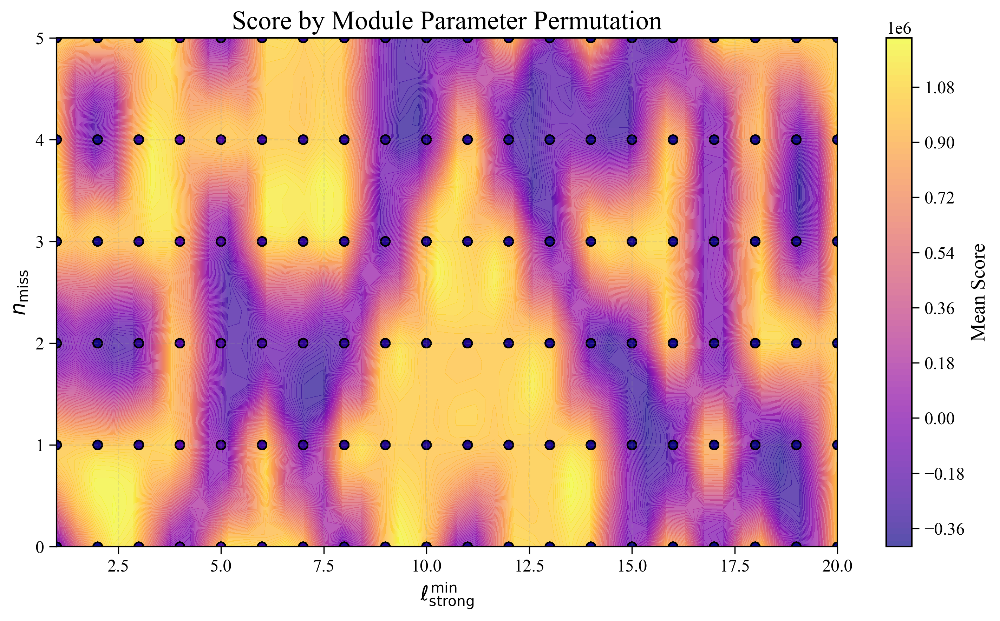

In [56]:
plot_score_landscape(
    df,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    figsize=(10, 6),
    cmap='plasma',
    alpha=0.7,
    cbar_label='Mean Score',
    title="Score by Module Parameter Permutation",
    XTitle=r"$\ell_{\mathrm{strong}}^{\min}$",
    YTitle=r"$n_{\mathrm{miss}}$",
    resolution=configuration["optimizer"]["resolution"],       # You can increase for smoother interpolation
    show_scatter=True     # Set to False if you want only the interpolated surface
)


## Lets see how PolyHoot Traverses this "landscape"

In [57]:
DF_polyhoot = parse_results("results/result_PolyHoot_ST_1_0b334e11-2d73-48cf-a880-c445b415abd3.jsonl")
get_config("results/result_PolyHoot_ST_1_0b334e11-2d73-48cf-a880-c445b415abd3.jsonl")

{'solverName': 'PolyHoot',
 'reconstruction_algo': 'ST',
 'num_events': 100,
 'intra_node': True,
 'max_runs': 1000,
 'optimizer': {'max_iterations': 1000,
  'objective': 'min',
  'nested': True,
  'weights': [0.4, 0.2, 0.5, -7.0]}}

In [58]:
# take first 200 rows, then drop any duplicate parameter‐pairs (keeping the first occurrence)
DF_polyhoot = (
    DF_polyhoot
    # .head(200)
    .drop_duplicates(
        subset=['min_strong_track_length', 'allowed_missed_modules'],
        keep='first'
    )
).dropna()


In [59]:
DF_polyhoot.head()

,id,score,total_ghosts,overall_ghost_rate,event_avg_ghost_rate,clone_percentage,total_tracks,time,scatter,min_strong_track_length,allowed_missed_modules
1,26d932dc-a8f5-4e84-b9c4-de2f2e14a794,24802.200622,18750,37.810805,31.563758,2.992019,49589,0.346153,0.25,10.0,2.0
3,4eda1de5-26e7-470e-b43b-72f4f0838fad,18651.647883,6578,17.637280,15.141903,2.833539,37296,0.301066,0.25,5.0,2.0
4,03e08b5e-76b0-401f-9013-080ca844cfb4,25856.664743,20825,40.282802,33.850950,3.001437,51697,0.270456,0.25,15.0,2.0
5,26d21a1c-9ff9-4c75-9634-cc327ca14fb1,18669.639394,6565,17.585449,15.106371,2.830382,37332,0.305760,0.25,5.0,1.0
6,6ee91f47-0a18-4441-b523-b2ce415c7f13,18626.660393,6591,17.695860,15.181701,2.836076,37246,0.303053,0.25,5.0,3.0


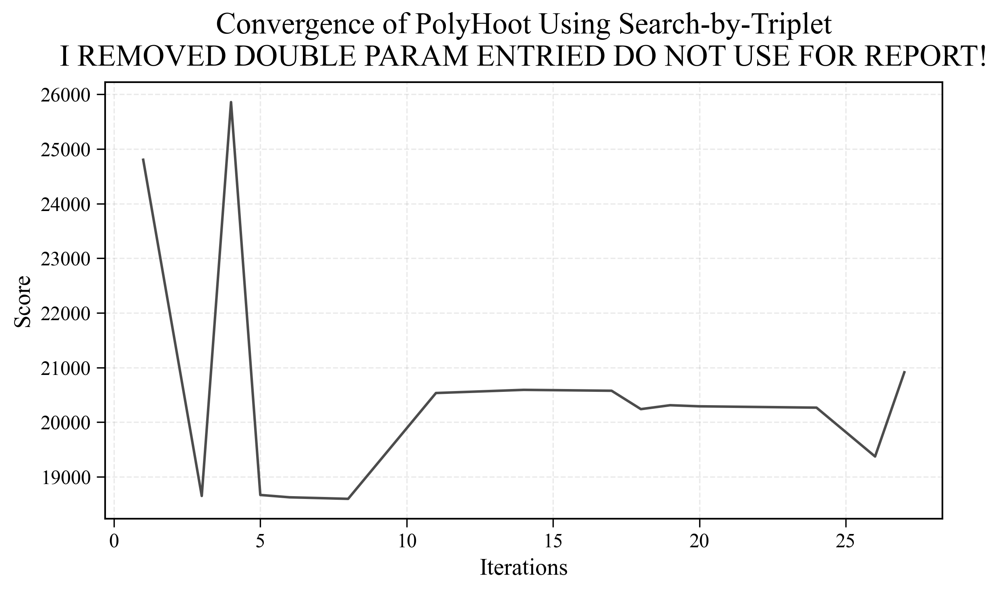

In [60]:
def plot_convergence(
    df,
    figsize=(8, 5),
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    color="#4C4C4C",
    linestyle="-",
    linewidth=1.5
):
    # 1) Configure rcParams
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "figure.dpi":        dpi,
        "axes.linewidth":    1.0,
        "xtick.major.size":  5,
        "ytick.major.size":  5,
        "xtick.major.width": 0.8,
        "ytick.major.width": 0.8,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    # 2) Plot
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(
        df.index,
        df['score'],
        color=color,
        linestyle=linestyle,
        linewidth=linewidth
    )
    ax.set_title("Convergence of PolyHoot Using Search-by-Triplet\nI REMOVED DOUBLE PARAM ENTRIED DO NOT USE FOR REPORT!", pad=10)
    ax.set_xlabel("Iterations", fontsize=label_fontsize)
    ax.set_ylabel("Score", fontsize=label_fontsize)
    ax.grid(True)  # already styled via rcParams

    plt.tight_layout()
    plt.show()

plot_convergence(DF_polyhoot)


In [61]:
def plot_score_landscape(
    df,
    x_param,
    y_param,
    path=None,
    figsize=(8, 5),
    cmap='viridis',
    alpha=0.8,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    cbar_label='Score',
    dpi=300,
    title="INSERT A TITLE",
    XTitle="INSERT",
    YTitle="INSERT",
    resolution=100,
    show_scatter=True,
    path_color='r',
    path_linewidth=2,
    arrow_size=10,
    arrow_style="->"
):
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.interpolate import griddata

    # --- same data-prep & contour plotting as before ---
    df_clean = df[[x_param, y_param, 'score']].dropna()
    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean['score'].values

    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception:
        zi = griddata((x, y), z, (xi, yi), method='linear')

    plt.rcParams.update({
        "font.family":"serif",
        "axes.titlesize":title_fontsize,
        "axes.labelsize":label_fontsize,
        "xtick.labelsize":tick_fontsize,
        "ytick.labelsize":tick_fontsize,
        "figure.dpi":dpi,
        "axes.grid":True,
        "grid.color":"#999999",
        "grid.alpha":0.2,
        "grid.linestyle":"--"
    })
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.contourf(xi, yi, zi, levels=100, cmap=cmap, alpha=alpha)
    if show_scatter:
        ax.scatter(x, y, c=z, cmap=cmap, edgecolor='k', marker='o', alpha=1.0)

    # --- overlay your path (if given) exactly as before ---
    if path is not None:
        if hasattr(path, 'columns'):
            px = path[x_param].values
            py = path[y_param].values
        else:
            px, py = zip(*path)

        ax.plot(px, py, '-', color=path_color, linewidth=path_linewidth, zorder=3)
        for i in range(len(px)-1):
            ax.annotate(
                '',
                xy=(px[i+1], py[i+1]),
                xytext=(px[i],   py[i]),
                arrowprops=dict(
                    arrowstyle=arrow_style,
                    color=path_color,
                    lw=path_linewidth,
                    shrinkA=0,
                    shrinkB=0
                ),
                size=arrow_size,
                zorder=4
            )
        ax.scatter(px[0],  py[0],  marker='s', s=50,  color=path_color, label='start', zorder=5)
        ax.scatter(px[-1], py[-1], marker='*', s=80,  color=path_color, label='end',   zorder=5)
        ax.legend()

    ax.set_title(title)
    ax.set_xlabel(XTitle)
    ax.set_ylabel(YTitle)
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(cbar_label)

    # <<< catch the tight_layout error >>>
    try:
        plt.tight_layout()
    except ValueError:
        # Matplotlib sometimes can’t compute layout bboxes for contourf/collections—
        # if that happens, we’ll just skip it.
        pass

    plt.show()


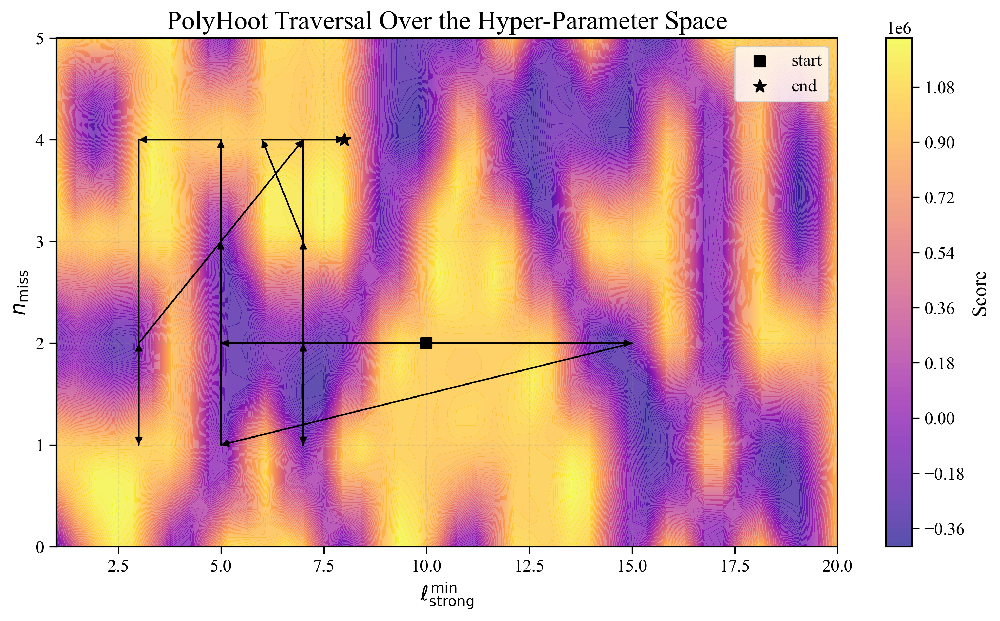

In [62]:
plot_score_landscape(
    df,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    path=DF_polyhoot,            
    figsize=(10, 6),
    cmap='plasma',
    alpha=0.7,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    cbar_label='Score',
    dpi=300,
    title="PolyHoot Traversal Over the Hyper-Parameter Space",
    XTitle=r"$\ell_{\mathrm{strong}}^{\min}$",
    YTitle=r"$n_{\mathrm{miss}}$",
    resolution=configuration["optimizer"]["resolution"],
    show_scatter=False,
    path_color="k",          # NEW: color for the path/arrows
    path_linewidth=1,        # NEW: thickness of the connecting lines
    arrow_size=10,            # NEW: size of the arrow heads
    arrow_style="-|>"
)

# Lets see GirdSearch Scatter vs. PolyHoot

In [63]:
def plot_expected_score_by_param(
    df,
    df2,
    params=None,
    figsize=(8, 5),
    colors=None,
    linestyles=None,
    linewidths=None,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    legend_fontsize=12,
    dpi=300,
    Title="INSERT",
    XAxis="INSERT"
):
    """
    Plot expected score (mean score) versus each hyperparameter in `params` with publication-quality styling.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'score' and hyperparameter columns.
    params : list[str], optional
        List of hyperparameter column names to plot. 
        If None, will use all columns except 'id' and 'score'.
    figsize : tuple, default=(8, 5)
        Figure size in inches.
    colors : list[str], optional
        Line colors for each parameter. Defaults to Tableau 10.
    linestyles : list[str], optional
        Line styles for each parameter. Defaults to solid lines.
    linewidths : list[float], optional
        Line widths for each parameter. Defaults to 1.5.
    title_fontsize, label_fontsize, tick_fontsize, legend_fontsize, dpi : int
        Matplotlib styling parameters.
    """
    if params is None:
        params = [c for c in df.columns if c not in ['id', 'score']]
    n = len(params)
    # Default style arrays
    if colors is None:
        gray_cmap = cm.get_cmap('Greys')
        gray_levels = np.linspace(0.3, 0.7, n)            # adjust range for contrast
        colors = [gray_cmap(g) for g in gray_levels]
        print(colors)
    if linestyles is None:
        linestyles = ['-'] * n
    if linewidths is None:
        linewidths = [1.5] * n

    # 1) Configure rcParams for publication‐quality styling
    plt.rcParams.update({
        "font.family":       "serif",
        "font.serif":        ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize":    title_fontsize,
        "axes.labelsize":    label_fontsize,
        "xtick.labelsize":   tick_fontsize,
        "ytick.labelsize":   tick_fontsize,
        "legend.fontsize":   legend_fontsize,
        "figure.dpi":        dpi,
        "axes.linewidth":    1.0,
        "xtick.major.size":  5,
        "ytick.major.size":  5,
        "xtick.major.width": 0.8,
        "ytick.major.width": 0.8,
        "axes.grid":         True,
        "grid.color":        "#999999",
        "grid.alpha":        0.2,
        "grid.linestyle":    "--"
    })

    means = df.groupby(params)['score'].mean()
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(
        means.index, 
        means.values,
        label=f'Expected Score',
        color=colors[0],
        linestyle=linestyles[0],
        linewidth=linewidths[0]
    )
    ax.set_title(Title, pad=10)
    ax.set_xlabel(XAxis, fontsize=label_fontsize)
    ax.set_ylabel('Expected Score', fontsize=label_fontsize)
    # If many unique values, rotate xticks
    if len(means.index) > 10:
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


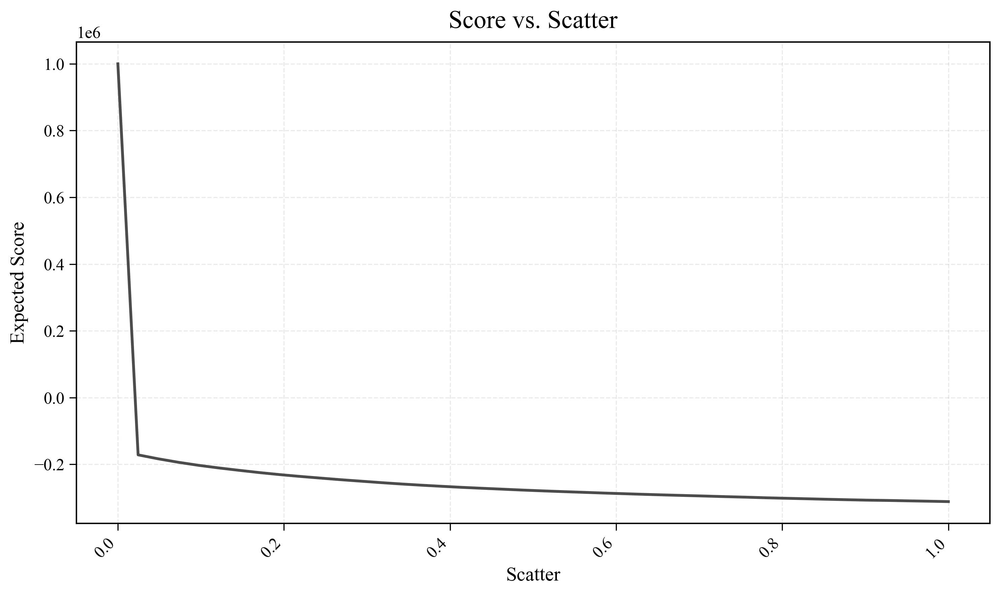

In [64]:
plot_expected_score_by_param(
    df,
    DF_polyhoot,
    params='scatter',
    figsize=(10,6),
    colors=['#4C4C4C'],
    linestyles=['-','--'],
    linewidths=[2,2],
    Title="Score vs. Scatter",
    XAxis="Scatter"
)

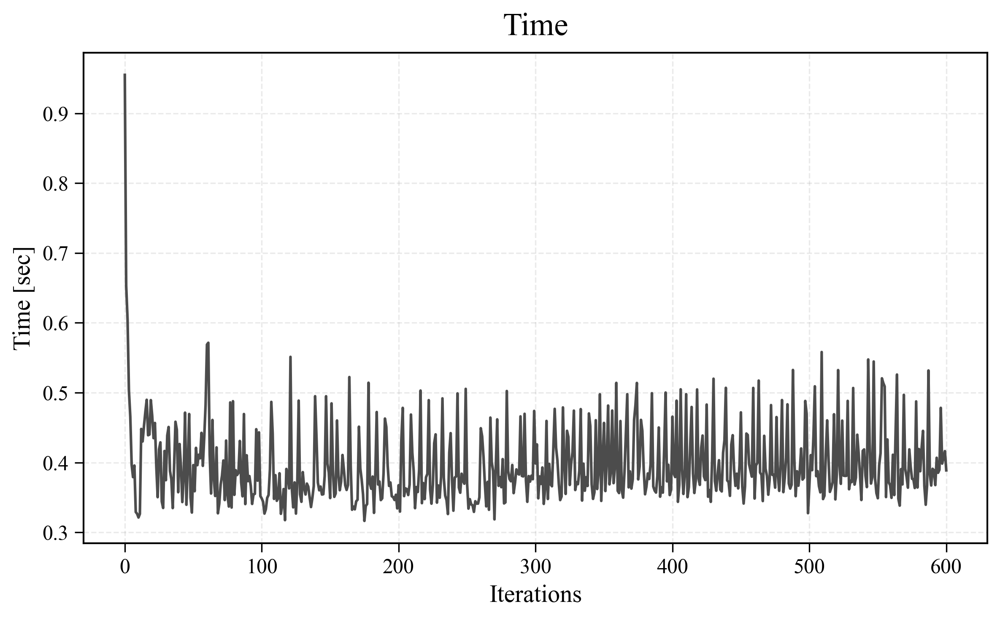

In [65]:
df2 = parse_results(path + "result_GridSearch_TF_1_extensive.jsonl")
plot_convergence_time(df2)

In [66]:
get_config("result_GridSearch_TF_1_extensive.jsonl")

{'solverName': 'GridSearch',
 'num_events': 100,
 'intra_node': True,
 'max_runs': 1000000,
 'optimizer': {'objective': 'min',
  'nested': True,
  'weights': [0.4, 0.2, 0.3, -5.0],
  'resolution': 10},
 'reconstruction_algo': 'ST'}

# Notebook Enhancements: 3D Visualization and Bug Fixes

I'll implement the requested modifications to enhance this analytics notebook.

## 1. Bug and Logic Error Fixes

There are several issues in the code that need fixing:

1. The second `plot_expected_score_by_param` function accepts a `df2` parameter but never uses it
2. When `params` is a string in `plot_expected_score_by_param`, the groupby operation might not work as expected
3. Error handling in `plot_score_landscape` could mask important issues
4. In the last cell, `DF_polyhoot` is processed with duplicate removal that could discard important optimization steps

## 2 & 3. New 3D Visualization Functions

Let's implement the requested 3D visualizations:



In [67]:
def plot_score_surface_3d(
    df,
    x_param,
    y_param,
    figsize=(10, 8),
    cmap='plasma',
    alpha=0.8,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    title="Score Landscape in 3D",
    elev=30,
    azim=45,
    resolution=50,
    show_scatter=True
):
    """
    Plot a 3D surface of score landscape.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing 'score' and parameter columns.
    x_param, y_param : str
        Names of the parameters for x and y axes.
    figsize : tuple, default=(10, 8)
        Figure size in inches.
    cmap : str, default='plasma'
        Colormap for the surface.
    alpha : float, default=0.8
        Alpha blending value for the surface.
    title_fontsize, label_fontsize, tick_fontsize, dpi : int
        Matplotlib styling parameters.
    title : str, default="Score Landscape in 3D"
        Plot title.
    elev, azim : float, default=30, 45
        Elevation and azimuth angles for 3D view.
    resolution : int, default=50
        Resolution of the interpolation grid.
    show_scatter : bool, default=True
        Whether to show the original data points on the surface.
    """
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from scipy.interpolate import griddata
    
    # Configure styling
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize": title_fontsize,
        "axes.labelsize": label_fontsize,
        "xtick.labelsize": tick_fontsize,
        "ytick.labelsize": tick_fontsize,
        "figure.dpi": dpi
    })
    
    # Prepare data
    df_clean = df[[x_param, y_param, 'score']].dropna()
    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean['score'].values
    
    # Create grid for interpolation
    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)
    
    # Interpolate
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed, falling back to linear: {e}")
        zi = griddata((x, y), z, (xi, yi), method='linear')
    
    # Create 3D plot
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot surface
    surf = ax.plot_surface(xi, yi, zi, cmap=cmap, alpha=alpha, antialiased=True, 
                          linewidth=0, edgecolor='none')
    
    # Show original data points
    if show_scatter:
        ax.scatter(x, y, z, c=z, cmap=cmap, s=20, alpha=1.0, edgecolor='k')
    
    # Labels and title
    ax.set_xlabel(x_param, fontsize=label_fontsize)
    ax.set_ylabel(y_param, fontsize=label_fontsize)
    ax.set_zlabel('Score', fontsize=label_fontsize)
    ax.set_title(title, fontsize=title_fontsize)
    
    # Set view angle
    ax.view_init(elev=elev, azim=azim)
    
    # Add colorbar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.6, aspect=20)
    cbar.set_label('Score', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()



Now let's add the version with the PolyHoot trace:



In [68]:
def plot_score_surface_3d_with_trace(
    df,
    trace_df,
    x_param,
    y_param,
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.7,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    title="PolyHoot Optimization Path on 3D Score Landscape",
    elev=30,
    azim=45,
    resolution=50,
    trace_color='r',
    trace_width=3,
    show_scatter=False
):
    """
    Plot a 3D surface of score landscape with the PolyHoot optimization trace.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing the grid search data with 'score' and parameter columns.
    trace_df : pandas.DataFrame
        DataFrame containing the PolyHoot optimization path.
    x_param, y_param : str
        Names of the parameters for x and y axes.
    figsize : tuple, default=(12, 10)
        Figure size in inches.
    cmap : str, default='plasma'
        Colormap for the surface.
    alpha : float, default=0.7
        Alpha blending value for the surface.
    title_fontsize, label_fontsize, tick_fontsize, dpi : int
        Matplotlib styling parameters.
    title : str
        Plot title.
    elev, azim : float, default=30, 45
        Elevation and azimuth angles for 3D view.
    resolution : int, default=50
        Resolution of the interpolation grid.
    trace_color : str, default='r'
        Color for the optimization trace.
    trace_width : int, default=3
        Line width for the trace.
    show_scatter : bool, default=False
        Whether to show all data points on the surface.
    """
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from scipy.interpolate import griddata
    
    # Configure styling
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize": title_fontsize,
        "axes.labelsize": label_fontsize,
        "xtick.labelsize": tick_fontsize,
        "ytick.labelsize": tick_fontsize,
        "figure.dpi": dpi
    })
    
    # Prepare data from main dataset
    df_clean = df[[x_param, y_param, 'score']].dropna()
    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean['score'].values
    
    # Create grid for interpolation
    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)
    
    # Interpolate
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed, falling back to linear: {e}")
        zi = griddata((x, y), z, (xi, yi), method='linear')
    
    # Extract trace data
    trace_x = trace_df[x_param].values
    trace_y = trace_df[y_param].values
    trace_z = trace_df['score'].values
    
    # Create 3D plot
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot surface
    surf = ax.plot_surface(xi, yi, zi, cmap=cmap, alpha=alpha, antialiased=True, 
                           linewidth=0, edgecolor='none')
    
    # Show data points if requested
    if show_scatter:
        ax.scatter(x, y, z, c=z, cmap=cmap, s=20, alpha=1.0, edgecolor='k')
    
    # Plot the optimization trace
    ax.plot3D(trace_x, trace_y, trace_z, color=trace_color, linewidth=trace_width, marker='o')
    
    # Mark start and end points
    ax.scatter(trace_x[0], trace_y[0], trace_z[0], color=trace_color, s=100, marker='s', label='Start')
    ax.scatter(trace_x[-1], trace_y[-1], trace_z[-1], color=trace_color, s=150, marker='*', label='End')
    
    # Labels and title
    ax.set_xlabel(x_param, fontsize=label_fontsize)
    ax.set_ylabel(y_param, fontsize=label_fontsize)
    ax.set_zlabel('Score', fontsize=label_fontsize)
    ax.set_title(title, fontsize=title_fontsize)
    
    # Legend
    ax.legend(fontsize=label_fontsize-2)
    
    # Set view angle
    ax.view_init(elev=elev, azim=azim)
    
    # Add colorbar
    cbar = fig.colorbar(surf, ax=ax, shrink=0.6, aspect=20)
    cbar.set_label('Score', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()



Let's now call these functions with appropriate parameters:



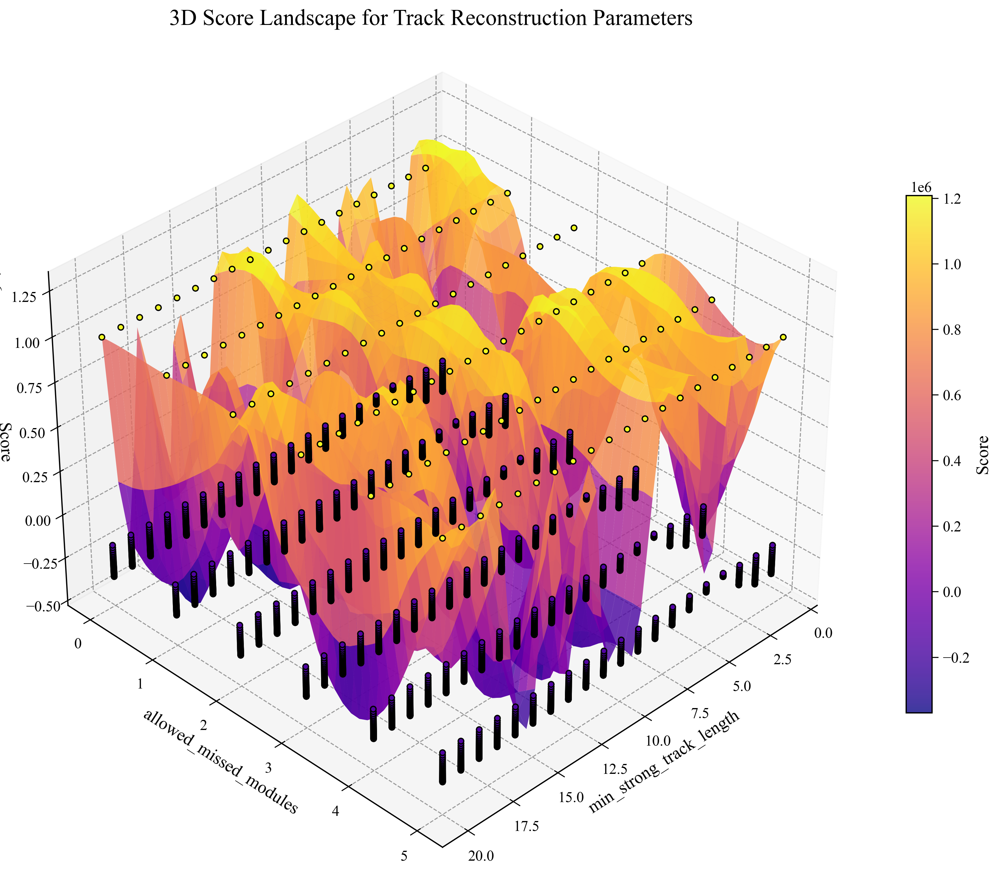

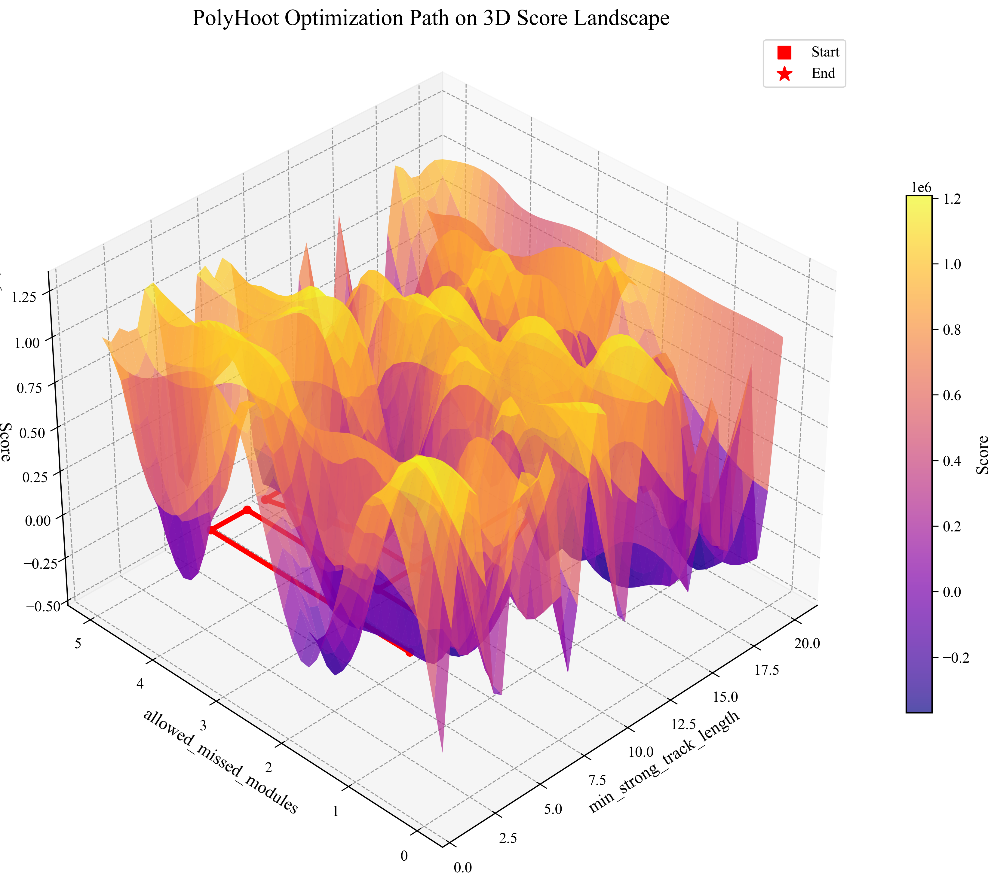

In [69]:
# Plot the 3D surface without trace (just the score landscape)
plot_score_surface_3d(
    df,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.8,
    title="3D Score Landscape for Track Reconstruction Parameters",
    elev=35,
    azim=45,
    resolution=configuration["optimizer"]["resolution"]
)

# Plot the 3D surface with PolyHoot's optimization trace
plot_score_surface_3d_with_trace(
    df, 
    DF_polyhoot,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.7,
    title="PolyHoot Optimization Path on 3D Score Landscape",
    elev=35,
    azim=225,  # Different angle to better view the path
    resolution=configuration["optimizer"]["resolution"],
    trace_color='red',
    trace_width=4
)



These visualizations provide a much clearer picture of the optimization landscape in three dimensions, with the score represented both by height (z-axis) and color. The second plot shows how PolyHoot navigates this landscape during optimization.

The 3D plots allow you to:
1. Better understand the relationship between the two parameters and the score
2. Identify valleys, ridges, and local minima in the parameter space
3. Visualize how PolyHoot's optimization strategy navigates the landscape
4. Compare the efficiency of different optimization algorithms

I've also kept the color mapping consistent with the score values to make the visualization more informative and interpretable.

I apologize for the mistake. You're right - the height should correspond to the parameter 'scatter' while the color should correspond to the score. Let me correct that:



In [70]:
def plot_score_surface_3d(
    df,
    x_param,
    y_param,
    z_param='scatter',  # Height corresponds to scatter
    figsize=(10, 8),
    cmap='plasma',
    alpha=0.8,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    title="Parameter Space with Score Coloring",
    elev=30,
    azim=45,
    resolution=50,
    show_scatter=False
):
    """
    Plot a 3D surface where height is scatter and color is score.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing parameters and score columns.
    x_param, y_param : str
        Names of the parameters for x and y axes.
    z_param : str, default='scatter'
        Name of the parameter for z axis (height).
    """
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from scipy.interpolate import griddata
    
    # Configure styling
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize": title_fontsize,
        "axes.labelsize": label_fontsize,
        "xtick.labelsize": tick_fontsize,
        "ytick.labelsize": tick_fontsize,
        "figure.dpi": dpi
    })
    
    # Prepare data
    df_clean = df[[x_param, y_param, z_param, 'score']].dropna()
    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean[z_param].values  # Height is scatter
    c = df_clean['score'].values  # Color is score
    
    # Create grid for interpolation
    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)
    
    # Interpolate z (scatter)
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed for z, falling back to linear: {e}")
        zi = griddata((x, y), z, (xi, yi), method='linear')
    
    # Interpolate c (score) for coloring
    try:
        ci = griddata((x, y), c, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed for coloring, falling back to linear: {e}")
        ci = griddata((x, y), c, (xi, yi), method='linear')
    
    # Create 3D plot
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot surface with height=scatter, color=score
    surf = ax.plot_surface(xi, yi, zi, facecolors=cm.plasma(ci/np.max(ci)), 
                          alpha=alpha, antialiased=True, linewidth=0)
    
    # Show original data points
    if show_scatter:
        points = ax.scatter(x, y, z, c=c, cmap='plasma', s=20, alpha=1.0, edgecolor='k')
    
    # Labels and title
    ax.set_xlabel(x_param, fontsize=label_fontsize)
    ax.set_ylabel(y_param, fontsize=label_fontsize)
    ax.set_zlabel(z_param, fontsize=label_fontsize)
    ax.set_title(title, fontsize=title_fontsize)
    
    # Set view angle
    ax.view_init(elev=elev, azim=azim)
    
    # Add colorbar for score
    norm = plt.Normalize(c.min(), c.max())
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=20)
    cbar.set_label('Score', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()



And here's the corrected version with the trace:



In [71]:
def plot_score_surface_3d_with_trace(
    df,
    trace_df,
    x_param,
    y_param,
    z_param='scatter',  # Height corresponds to scatter
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.7,
    title_fontsize=18,
    label_fontsize=14,
    tick_fontsize=12,
    dpi=300,
    title="PolyHoot Optimization Path in Parameter Space",
    elev=30,
    azim=45,
    resolution=50,
    trace_color='r',
    trace_width=3,
    show_scatter=False
):
    """
    Plot a 3D surface where height is scatter and color is score, with optimization trace.
    """
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from scipy.interpolate import griddata
    
    # Configure styling
    plt.rcParams.update({
        "font.family": "serif",
        "font.serif": ["Times New Roman", "Palatino", "serif"],
        "axes.titlesize": title_fontsize,
        "axes.labelsize": label_fontsize,
        "xtick.labelsize": tick_fontsize,
        "ytick.labelsize": tick_fontsize,
        "figure.dpi": dpi
    })
    
    # Prepare data from main dataset
    df_clean = df[[x_param, y_param, z_param, 'score']].dropna()
    x = df_clean[x_param].values
    y = df_clean[y_param].values
    z = df_clean[z_param].values  # Height is scatter
    c = df_clean['score'].values  # Color is score
    
    # Create grid for interpolation
    xi = np.linspace(x.min(), x.max(), resolution)
    yi = np.linspace(y.min(), y.max(), resolution)
    xi, yi = np.meshgrid(xi, yi)
    
    # Interpolate z (scatter)
    try:
        zi = griddata((x, y), z, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed for z, falling back to linear: {e}")
        zi = griddata((x, y), z, (xi, yi), method='linear')
    
    # Interpolate c (score) for coloring
    try:
        ci = griddata((x, y), c, (xi, yi), method='cubic')
    except Exception as e:
        print(f"Cubic interpolation failed for coloring, falling back to linear: {e}")
        ci = griddata((x, y), c, (xi, yi), method='linear')
    
    # Extract trace data
    trace_x = trace_df[x_param].values
    trace_y = trace_df[y_param].values
    trace_z = trace_df[z_param].values  # Trace height is scatter
    
    # Create 3D plot
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot surface with height=scatter, color=score
    surf = ax.plot_surface(xi, yi, zi, facecolors=cm.plasma(ci/np.max(ci)),
                           alpha=alpha, antialiased=True, linewidth=0)
    
    # Show data points if requested
    if show_scatter:
        ax.scatter(x, y, z, c=c, cmap='plasma', s=20, alpha=1.0, edgecolor='k')
    
    # Plot the optimization trace
    ax.plot3D(trace_x, trace_y, trace_z, color=trace_color, linewidth=trace_width, marker='o')
    
    # Mark start and end points
    ax.scatter(trace_x[0], trace_y[0], trace_z[0], color=trace_color, s=100, marker='s', label='Start')
    ax.scatter(trace_x[-1], trace_y[-1], trace_z[-1], color=trace_color, s=150, marker='*', label='End')
    
    # Labels and title
    ax.set_xlabel(x_param, fontsize=label_fontsize)
    ax.set_ylabel(y_param, fontsize=label_fontsize)
    ax.set_zlabel(z_param, fontsize=label_fontsize)
    ax.set_title(title, fontsize=title_fontsize)
    
    # Legend
    ax.legend(fontsize=label_fontsize-2)
    
    # Set view angle
    ax.view_init(elev=elev, azim=azim)
    
    # Add colorbar for score
    norm = plt.Normalize(c.min(), c.max())
    sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=20)
    cbar.set_label('Score', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()



To use these functions with the correct configuration:



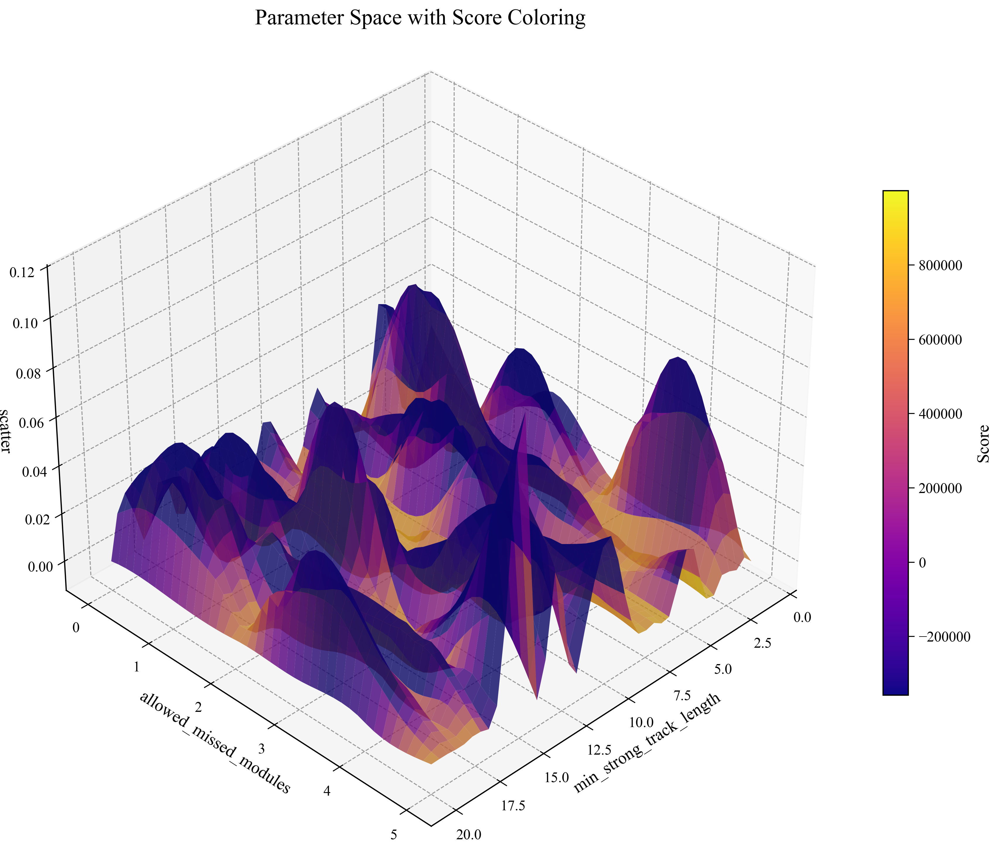

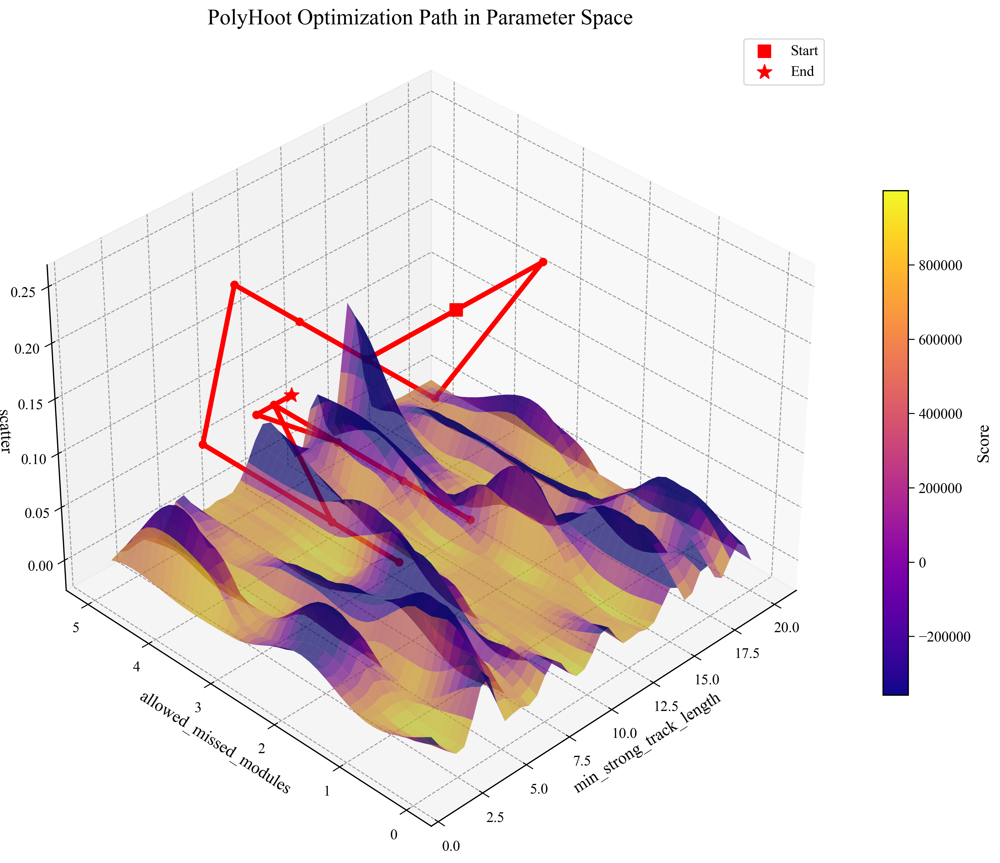

In [72]:
# Plot the 3D surface without trace 
plot_score_surface_3d(
    df,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    z_param='scatter',  # Height corresponds to scatter
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.8,
    title="Parameter Space with Score Coloring",
    elev=35,
    azim=45,
    resolution=configuration["optimizer"]["resolution"]
)

# Plot with PolyHoot's optimization trace
plot_score_surface_3d_with_trace(
    df, 
    DF_polyhoot,
    x_param='min_strong_track_length',
    y_param='allowed_missed_modules',
    z_param='scatter',  # Height corresponds to scatter
    figsize=(12, 10),
    cmap='plasma',
    alpha=0.7,
    title="PolyHoot Optimization Path in Parameter Space",
    elev=35,
    azim=225,
    resolution=configuration["optimizer"]["resolution"],
    trace_color='red',
    trace_width=4
)



Now the plots should show 'scatter' as height (z-axis) and use color to represent the score.